In [1]:
import sys
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/BayraktarLab/cell2location/')
sys.path.insert(1, '/nfs/team205/vk7/sanger_projects/my_packages/txnBurstProgramme/')

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl
import scipy

#import cell2location
import scvi
import txnburst
import hashlib

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
import seaborn as sns

Global seed set to 0


In [2]:
def read_10x_output(file_path, smp_list, metadata=None, type = 'raw', umi_filter=5):
    import os
    
    #Writing output from separate samples, processed using CellRanger, into a dictionary of Scanpy objects:
    ad = {}

    #Generate AnnData for each sample
    for sample_name in smp_list:
        path = file_path + sample_name
        for i in os.listdir(path):
            if type in i and 'h5' in i:
                file = i
        ad[sample_name] = sc.read_10x_h5(file_path + sample_name +'/'+file)
        ad[sample_name].var.rename(columns = {'gene_ids':'ENSEMBL'}, inplace = True)
        ad[sample_name].var['SYMBOL'] = ad[sample_name].var.index
        ad[sample_name].var.index = ad[sample_name].var['ENSEMBL']
        ad[sample_name].var.drop(columns=['ENSEMBL'], inplace=True)
        #ad[sample_name].var_names_make_unique() 
        
        
        sc.pp.calculate_qc_metrics(ad[sample_name], inplace=True)
        ad[sample_name] = ad[sample_name][ad[sample_name].obs['total_counts'] > umi_filter, :]
        ad[sample_name].var['mt'] = [gene.startswith('mt-') 
                                     for gene in ad[sample_name].var['SYMBOL']]
        ad[sample_name].obs['mt_frac'] = (ad[sample_name][:, 
               ad[sample_name].var['mt'].tolist()].X.sum(1).A.squeeze() 
                                          / ad[sample_name].obs['total_counts'])
        
        ad[sample_name].obs['sample'] = sample_name
        ad[sample_name].obs['barcode'] = ad[sample_name].obs_names
        ad[sample_name].obs_names = ad[sample_name].obs['sample']+"_"+ad[sample_name].obs['barcode']

    #Merge AnnData objects from all the samples together    
    from scipy.sparse import vstack
    stack = vstack([ad[x].X for x in smp_list]) # stack data
    adata = sc.AnnData(stack, var = ad[smp_list[0]].var)
    adata.obs = pd.concat([ad[x].obs for x in smp_list], axis = 0)

    if metadata is not None:
        #Add cleaned metadata to the Anndata.obs table
        obs_merged = pd.merge(left = adata.obs, right = metadata, 
                              how = "left", left_on="sample", right_on="sample")
        obs_merged.index = obs_merged['sample']+"_"+obs_merged['barcode']
        print(obs_merged.index.equals(adata.obs.index))
        adata.obs = obs_merged

    return adata, ad


In [3]:
results_folder = '/nfs/team205/vk7/sanger_projects/cell2state_tf_activation/pilot1/results/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/cell2state_tf_activation/pilot_aug_2022/data/'

sample_list = pd.DataFrame({
    'Description': [
        'cellranger-arc201_count_45496_TF-Multiome13021461_and_45498_TF-Multiome13027254_custom_ref',
        'cellranger-arc201_count_45496_TF-Multiome13021464_and_45498_TF-Multiome13027257_custom_ref',
        'cellranger-arc201_count_45496_TF-Multiome13021463_and_45498_TF-Multiome13027256_custom_ref',
        'cellranger-arc201_count_45496_TF-Multiome13021462_and_45498_TF-Multiome13027255_custom_ref',
    ],
    'sample': [
        'cellranger-arc201_count_30c2947600a7e76302ee9d479f1a8eef',
        'cellranger-arc201_count_c40244361abc247381a71b5e255cffbb',
        'cellranger-arc201_count_09932ae627452490dca5684f139e4529',
        'cellranger-arc201_count_9dce4f9de02114cf8e953ec24ba70019',
    ],
    'SUPPLIER_SAMPLE_NAME_RNA': [
        'cDNA-B1-GEX-25-1',
        'cDNA-B1-GEX-Bulk_2',
        'cDNA-B1-GEX-Bulk_1',
        'cDNA-B1-GEX-25-2',
    ],
    'SUPPLIER_SAMPLE_NAME_RNA': [
        'cDNA-B1-ATAC-25-1',
        'cDNA-B1-ATAC-Bulk_2',
        'cDNA-B1-ATAC-Bulk_1',
        'cDNA-B1-ATAC-25-2',
    ],
    'Experiment_group': [
        'sorted_top_bottom_25',
        'all_cells',
        'all_cells',
        'sorted_top_bottom_25',
    ]
})
sample_list

,Description,sample,SUPPLIER_SAMPLE_NAME_RNA,Experiment_group
0,cellranger-arc201_count_45496_TF-Multiome13021...,cellranger-arc201_count_30c2947600a7e76302ee9d...,cDNA-B1-ATAC-25-1,sorted_top_bottom_25
1,cellranger-arc201_count_45496_TF-Multiome13021...,cellranger-arc201_count_c40244361abc247381a71b...,cDNA-B1-ATAC-Bulk_2,all_cells
2,cellranger-arc201_count_45496_TF-Multiome13021...,cellranger-arc201_count_09932ae627452490dca568...,cDNA-B1-ATAC-Bulk_1,all_cells
3,cellranger-arc201_count_45496_TF-Multiome13021...,cellranger-arc201_count_9dce4f9de02114cf8e953e...,cDNA-B1-ATAC-25-2,sorted_top_bottom_25


In [4]:
results_folder = '/nfs/team205/vk7/sanger_projects/cell2state_tf_activation/pilot1/results/'
sc_data_folder = '/nfs/team205/vk7/sanger_projects/cell2state_tf_activation/pilot_aug_2022/data/'

adata, ad_list = read_10x_output(
    sc_data_folder, 
    smp_list=sample_list['sample'],
    metadata=sample_list, type = 'raw')
# export aggregated and pre-processed data
adata.write(sc_data_folder + 'all_cells_with_empty_20210917.h5ad')

adata, ad_list = read_10x_output(
    sc_data_folder, 
    smp_list=sample_list['sample'],
    metadata=sample_list, type = 'filtered')
# export aggregated and pre-processed data
adata.write(sc_data_folder + 'all_cells_20210917.h5ad')

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/tmp/ipykernel_238340/435707439.py:23: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad[sample_name].var['mt'] = [gene.startswith('mt-')
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_238340/435707439.py:23: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad[sample_name].var['mt'] = [gene.startswith('mt-

True


/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_238340/435707439.py:23: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad[sample_name].var['mt'] = [gene.startswith('mt-')
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_238340/435707439.py:23: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ad[sample_name].var['mt'] = [gene.startswith('mt-')
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages

True


In [5]:
def subset_cells(
    adata,
    cells_per_category=10000,
    stratify_category_key='sample',
):
    
    adata.obs['_cell_index'] = np.arange(adata.n_obs)
    subset_ind = list()
    
    for ct in adata.obs[stratify_category_key].unique():
        ind = adata.obs[stratify_category_key] == ct
        subset_ind_ = adata.obs['_cell_index'][ind]
        n_samples = np.min((len(subset_ind_), cells_per_category))
        subset_ind = subset_ind + list(np.random.choice(subset_ind_, size=n_samples, replace=False))
    print(len(subset_ind))
    
    return adata[subset_ind, :].copy()

def compute_pcs_knn_umap(
    adata_subset, 
    tech_category_key=None, plot_category_keys=list(), 
    scale_max_value=10, n_comps=100, n_neighbors=15,
):
    adata_subset.obs['total_counts'] = np.array(adata_subset.X.sum(1)).flatten()
    adata_subset.layers['counts'] = adata_subset.X.copy()
    # No normalisation by total count
    sc.pp.log1p(adata_subset)
    # Scale with no HVG selection
    if tech_category_key is None:
        sc.pp.scale(adata_subset, max_value=scale_max_value)
    else:
        for tech in adata_subset.obs[tech_category_key].unique():
            mu, std = compute_mu_std(adata_subset[adata_subset.obs[tech_category_key] == tech].X)
            adata_subset[adata_subset.obs[tech_category_key] == tech].X = (
                np.minimum((adata_subset[adata_subset.obs[tech_category_key] == tech].X - mu) / std, scale_max_value)
            )
    # A lot of PC dimensions
    sc.tl.pca(adata_subset, svd_solver='arpack', n_comps=n_comps, use_highly_variable=False)
    # Plot PCs to confirm that PC1 is indeed linked to total count
    # sc.pl.pca(adata_subset, color=['total_counts'],
    #           components=['1,2', '2,3', '4,5'],
    #           color_map = 'RdPu', ncols = 3, legend_loc='on data',
    #           legend_fontsize=10)
    plt.hist2d(adata_subset.obsm['X_pca'][:, 0].flatten(),
               adata_subset.obs['total_counts'].values.flatten(),
               bins=200,
               norm=mpl.colors.LogNorm());
    plt.xlabel('PC 1');
    plt.ylabel('Total RNA count');
    plt.show()

    # Remove PC1
    adata_subset.obsm['X_pca'] = adata_subset.obsm['X_pca'][:, 1:]
    adata_subset.varm['PCs'] = adata_subset.varm['PCs'][:, 1:]

    # compute KNN and UMAP to see how well this represents the dataset
    sc.pp.neighbors(adata_subset, n_neighbors=n_neighbors)
    sc.tl.umap(adata_subset, min_dist = 0.4, spread = 1.5)

    # Plot UMAP
    sc.pl.umap(adata_subset, color=[stratify_category_key] + plot_category_keys,
               color_map = 'RdPu', ncols = 3, #legend_loc='on data',
               legend_fontsize=10)
    return adata_subset

def compute_mu_std(X):
        
    mu = np.array(X.mean(0))
    mu_sq = mu ** 2
    X = X.copy()
    X.data = X.data ** 2
    sq_mu = np.array(X.mean(0))
    std = np.sqrt(sq_mu - mu_sq) + 1e-8
    
    return mu, std

29929


/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


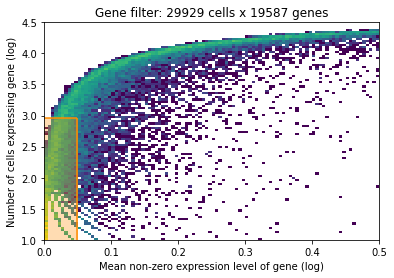

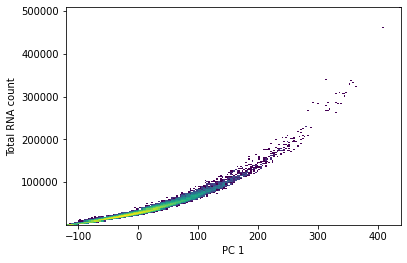

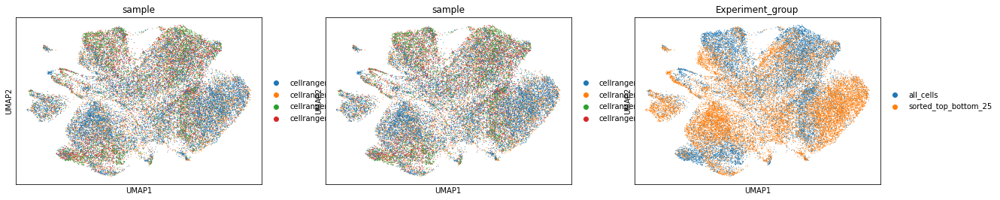

In [6]:
cells_per_category=20000
stratify_category_key='sample'
tech_category_key=None
plot_category_keys=['sample', 'Experiment_group']

#adata.uns['mod'] = dict()
#adata.uns['mod']['gene_names'] = list(adata.var_names[adata.var['variable_type'] == 'genes'])
#adata.uns['mod']['region_names'] = list(adata.var_names[adata.var['variable_type']!= 'genes'])

### Step 1.0 - select subset of data ###
np.random.seed(1)
adata_subset = subset_cells(
    adata, cells_per_category=cells_per_category, 
    stratify_category_key=stratify_category_key,
)
# select informative genes but keep all barcodes
from cell2location.utils.filtering import filter_genes
selected = filter_genes(adata_subset, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
plt.show()
# filter the object
targeted_tf_barcodes = [i for i in adata_subset.var_names if 'BARCODE' in i]
from re import sub
targeted_tf = [sub('_BARCODE', '', i) for i in targeted_tf_barcodes]
targeted_tf_ensembl = list(adata_subset.var_names[adata_subset.var['SYMBOL'].isin(targeted_tf).values])
adata_subset = adata_subset[:, np.unique(list(selected) + targeted_tf_barcodes + targeted_tf_ensembl)].copy()

### Step 1.1 - compute PCs by apply standard workflow with a few exceptions ##
adata_subset = compute_pcs_knn_umap(
    adata_subset, 
    tech_category_key=None, plot_category_keys=plot_category_keys, 
    scale_max_value=10, n_comps=50, n_neighbors=15,
)

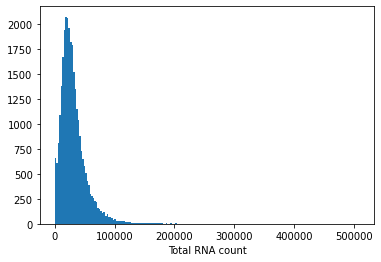

In [19]:
plt.hist(adata_subset.obs['total_counts'].values.flatten(), bins=200);
plt.xlabel('Total RNA count');
plt.show()

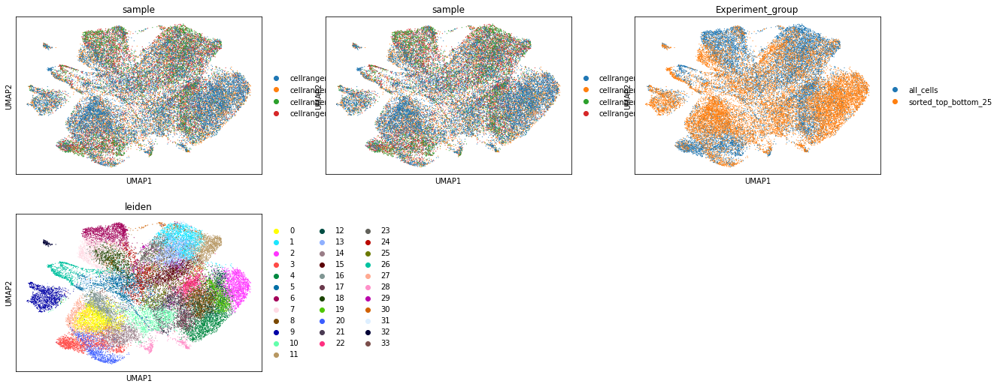

In [7]:
# Leiden clustering
sc.tl.leiden(adata_subset, resolution=2)

# Plot UMAP
sc.pl.umap(adata_subset, color=[stratify_category_key] + plot_category_keys + ['leiden'],
           color_map = 'RdPu', ncols = 3, #legend_loc='on data',
           size=5,
           legend_fontsize=10)

In [8]:
ipsc_tf = ['SOX2', 'KLF4', 'POU5F1', 'NANOG']
cell_cycle = ['MKI67', 'PCNA']
targeted_tf_barcodes, targeted_tf, ipsc_tf, cell_cycle

(['AIRE_BARCODE',
  'ASCL1_BARCODE',
  'DBX2_BARCODE',
  'DLX5_BARCODE',
  'FOXN1_BARCODE',
  'GATA2_BARCODE',
  'IRF3_BARCODE',
  'LHX6_BARCODE',
  'MAFB_BARCODE',
  'MYOD1_BARCODE',
  'NEUROG2_BARCODE',
  'OLIG1_BARCODE',
  'OLIG2_BARCODE',
  'PROX1_BARCODE',
  'RORA_BARCODE',
  'RORB_BARCODE',
  'SATB2_BARCODE'],
 ['AIRE',
  'ASCL1',
  'DBX2',
  'DLX5',
  'FOXN1',
  'GATA2',
  'IRF3',
  'LHX6',
  'MAFB',
  'MYOD1',
  'NEUROG2',
  'OLIG1',
  'OLIG2',
  'PROX1',
  'RORA',
  'RORB',
  'SATB2'],
 ['SOX2', 'KLF4', 'POU5F1', 'NANOG'],
 ['MKI67', 'PCNA'])

In [9]:
expected_tfs = [
'AIRE',
'ASCL1',
'DBX2',
'DLX1',
'DLX5',
'FOXN1',
'GATA2',
'IRF3',
'LHX6',
'MAFB',
'MYOD1',
'NEUROD2',
'NEUROG2',
'OLIG1',
'OLIG2',
'PROX1',
'RORA',
'RORB',
'SATB2',
]

[i for i in expected_tfs if i not in targeted_tf]

['DLX1', 'NEUROD2']

In [10]:
len(targeted_tf), len(expected_tfs)

(17, 19)

In [11]:
sample = adata_subset.obs['sample'].isin(["cellranger-arc201_count_09932ae627452490dca5684f139e4529"])
pd.Series(
    np.array(adata_subset[sample, targeted_tf_barcodes].layers['counts'].sum(0)).flatten(),
    index=targeted_tf_barcodes
)

AIRE_BARCODE          1.0
ASCL1_BARCODE      2131.0
DBX2_BARCODE          2.0
DLX5_BARCODE          2.0
FOXN1_BARCODE         0.0
GATA2_BARCODE         2.0
IRF3_BARCODE          5.0
LHX6_BARCODE          5.0
MAFB_BARCODE          2.0
MYOD1_BARCODE       521.0
NEUROG2_BARCODE       0.0
OLIG1_BARCODE       330.0
OLIG2_BARCODE         0.0
PROX1_BARCODE         1.0
RORA_BARCODE         16.0
RORB_BARCODE         35.0
SATB2_BARCODE       762.0
dtype: float32

In [20]:
pd.Series(
    np.array(adata_subset[:, targeted_tf_barcodes].layers['counts'].sum(0)).flatten(),
    index=targeted_tf_barcodes
)

AIRE_BARCODE         19.0
ASCL1_BARCODE      3330.0
DBX2_BARCODE          6.0
DLX5_BARCODE         47.0
FOXN1_BARCODE         7.0
GATA2_BARCODE        19.0
IRF3_BARCODE         21.0
LHX6_BARCODE         30.0
MAFB_BARCODE          6.0
MYOD1_BARCODE      2405.0
NEUROG2_BARCODE       0.0
OLIG1_BARCODE       599.0
OLIG2_BARCODE        10.0
PROX1_BARCODE         6.0
RORA_BARCODE         68.0
RORB_BARCODE         41.0
SATB2_BARCODE      3470.0
dtype: float32

In [12]:
sample = adata_subset.obs['sample'].isin(["cellranger-arc201_count_30c2947600a7e76302ee9d479f1a8eef"])
pd.Series(
    np.array((adata_subset[sample, targeted_tf_barcodes].layers['counts'] > 0).sum(0)).flatten(),
    index=targeted_tf_barcodes
)

AIRE_BARCODE         4
ASCL1_BARCODE      204
DBX2_BARCODE         1
DLX5_BARCODE        14
FOXN1_BARCODE        1
GATA2_BARCODE        7
IRF3_BARCODE        10
LHX6_BARCODE         5
MAFB_BARCODE         2
MYOD1_BARCODE      397
NEUROG2_BARCODE      0
OLIG1_BARCODE       74
OLIG2_BARCODE        2
PROX1_BARCODE        2
RORA_BARCODE         5
RORB_BARCODE         1
SATB2_BARCODE      320
dtype: int64

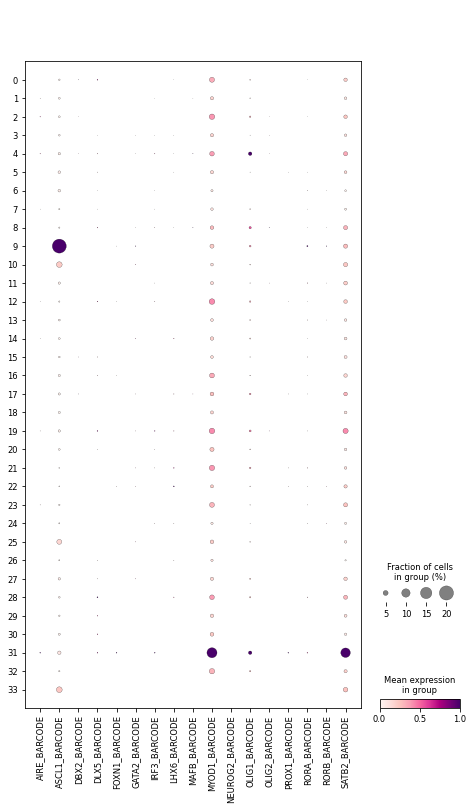

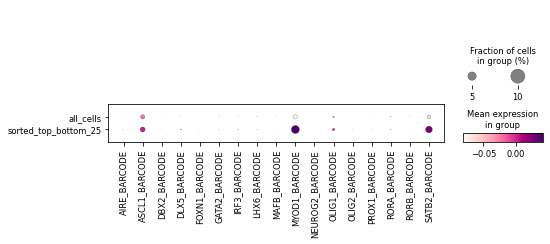

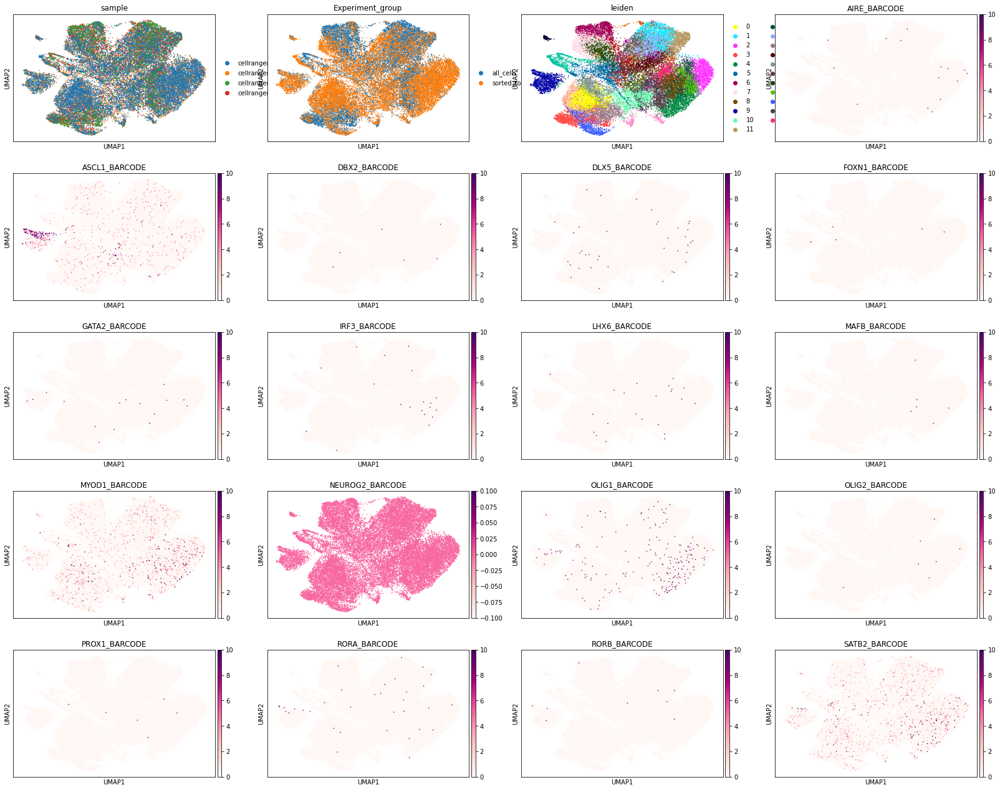

In [13]:
sc.pl.dotplot(adata_subset, targeted_tf_barcodes, 
              standard_scale='var',
              groupby='leiden', color_map = 'RdPu', gene_symbols='SYMBOL')
sc.pl.dotplot(adata_subset, targeted_tf_barcodes, 
              groupby='Experiment_group', color_map='RdPu', gene_symbols='SYMBOL')
sc.pl.umap(adata_subset, color=plot_category_keys + ['leiden'] + targeted_tf_barcodes,
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.999', size=10,
           legend_fontsize=10, gene_symbols='SYMBOL')

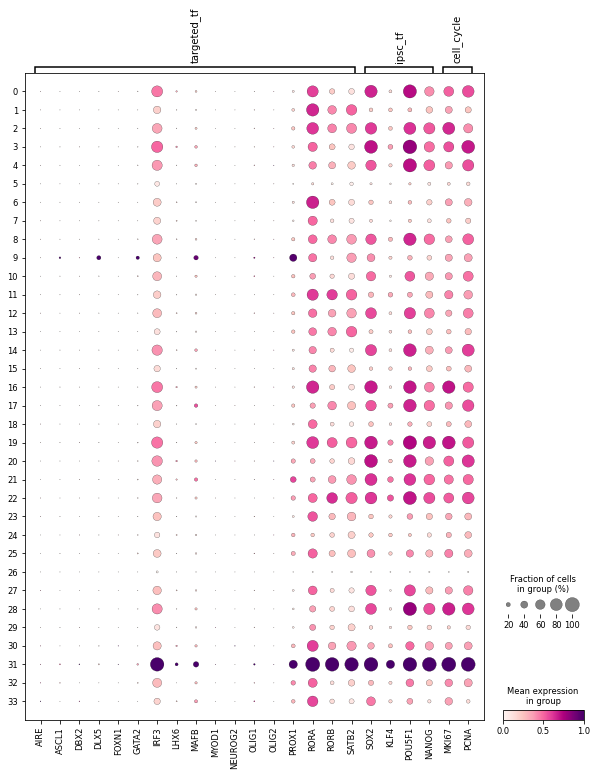

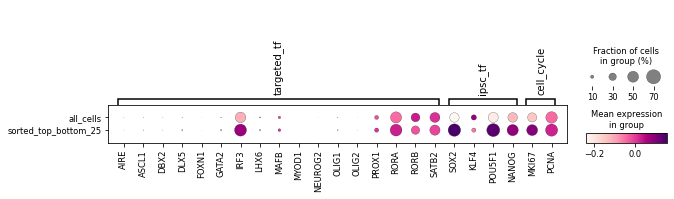

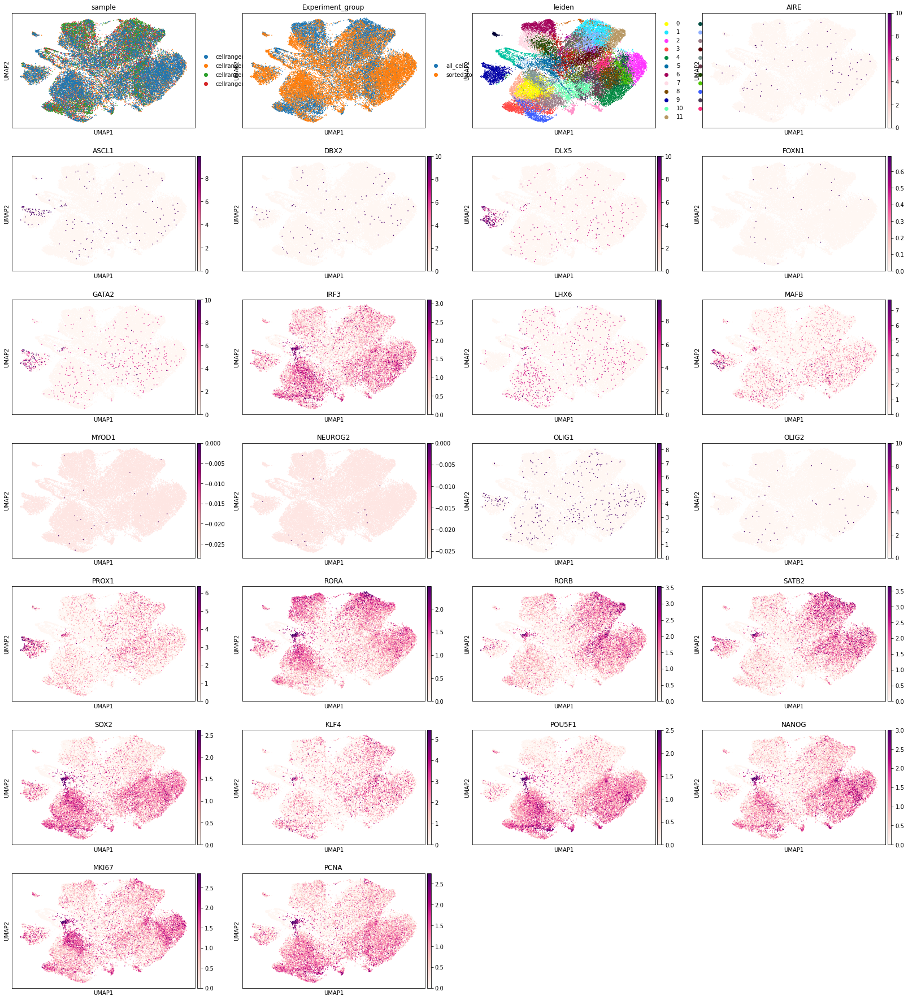

In [14]:
sc.pl.dotplot(adata_subset, {'targeted_tf': targeted_tf, 'ipsc_tf': ipsc_tf, 'cell_cycle': cell_cycle}, 
              standard_scale='var', smallest_dot=0.2,
              groupby='leiden', color_map='RdPu', gene_symbols='SYMBOL')
sc.pl.dotplot(adata_subset, {'targeted_tf': targeted_tf, 'ipsc_tf': ipsc_tf, 'cell_cycle': cell_cycle}, 
              groupby='Experiment_group', color_map='RdPu', gene_symbols='SYMBOL')
sc.pl.umap(adata_subset, color=plot_category_keys + ['leiden'] + targeted_tf + ipsc_tf + cell_cycle,
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.9', size=10,
           legend_fontsize=10, gene_symbols='SYMBOL')

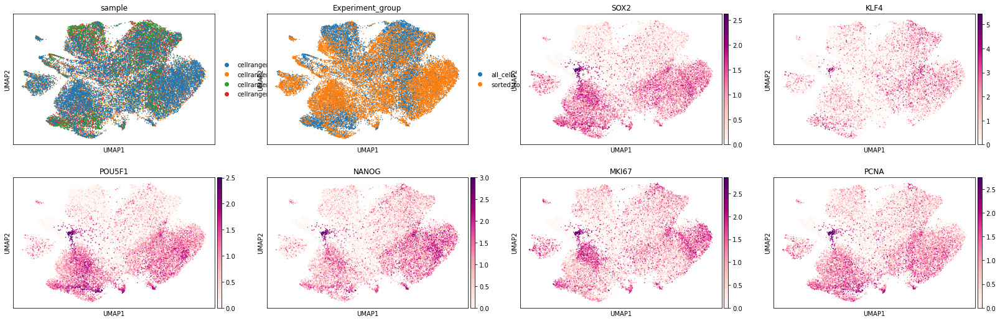

In [15]:
sc.pl.umap(adata_subset, color=plot_category_keys + ipsc_tf + cell_cycle,
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.9', size=10,
           legend_fontsize=10, gene_symbols='SYMBOL')

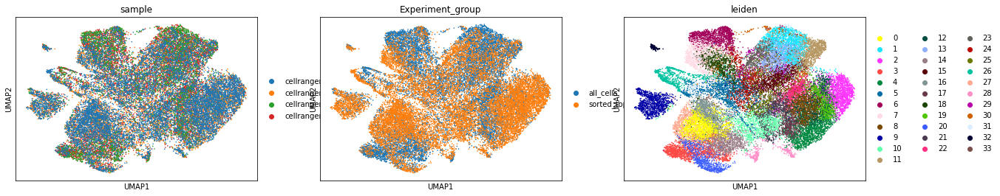

In [16]:
sc.pl.umap(adata_subset, color=plot_category_keys + ['leiden'],
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.9', size=10,
           legend_fontsize=10, gene_symbols='SYMBOL')

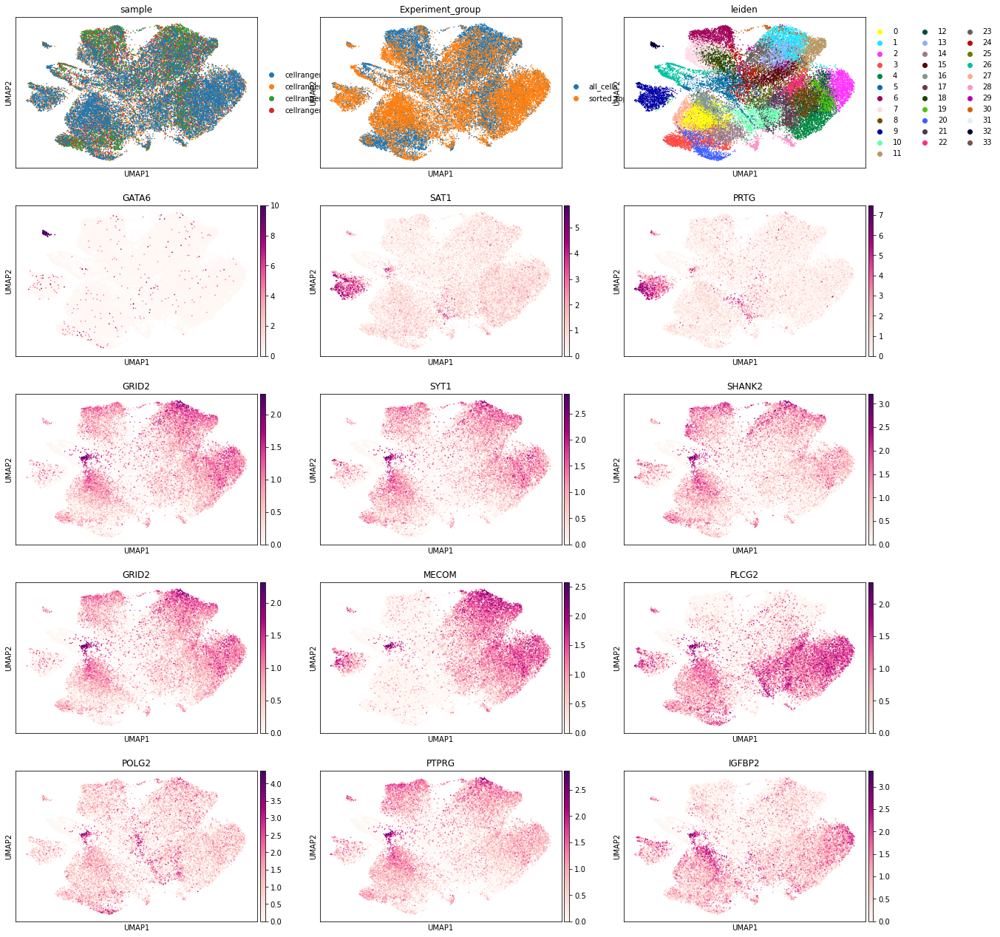

In [17]:
sc.pl.umap(adata_subset, color=plot_category_keys + ['leiden']
           + ['GATA6', 'SAT1', 'PRTG', 'GRID2', 'SYT1', 'SHANK2', 'GRID2', 
              'MECOM', 'PLCG2', 'POLG2', 'PTPRG', 'IGFBP2'],
           color_map='RdPu', ncols=3, #legend_loc='on data',
           vmin=0, vmax='p99.99', size=10,
           legend_fontsize=10, gene_symbols='SYMBOL')

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/team283/vk7/software/miniconda3farm5/en

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals_adj'] = pvals_adj[global_indices]
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  C

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scv

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/nfs/team283/vk7/software/miniconda3farm5/envs/te

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals'] = pvals[global_indices]
/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals_adj'] = pvals_adj[global_indices]
/nfs/team283/vk7/software/miniconda3farm5/envs/test_

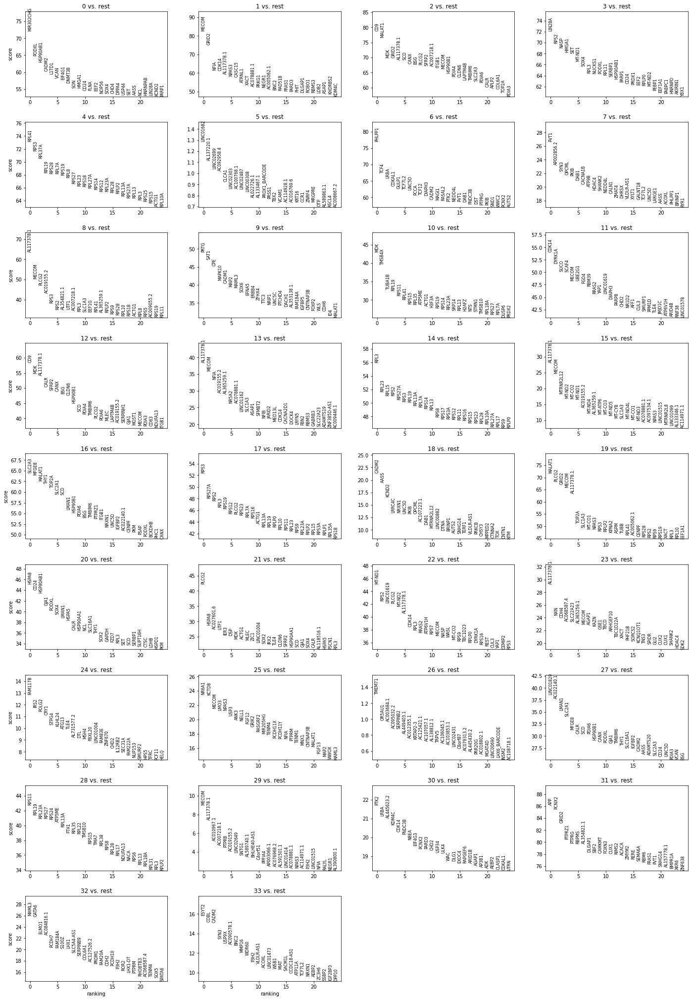

In [18]:
sc.tl.rank_genes_groups(adata_subset, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_subset, n_genes=25, sharey=False, gene_symbols='SYMBOL')

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


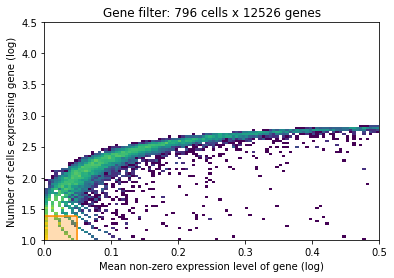

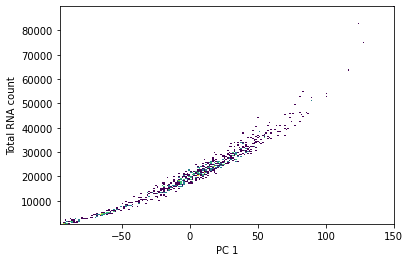

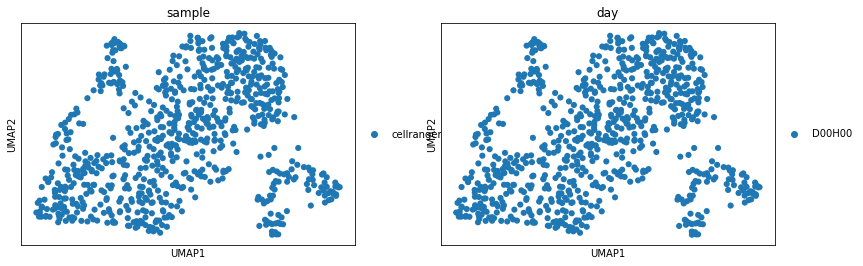

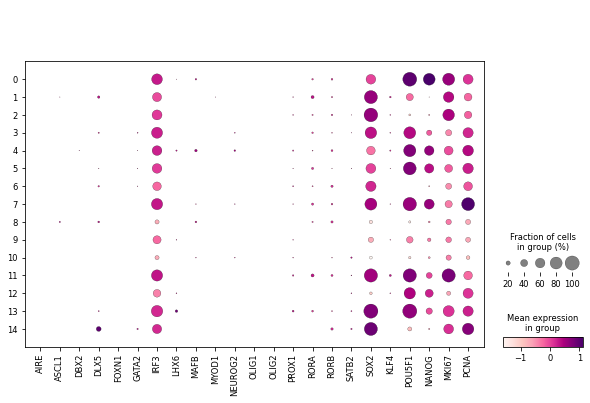

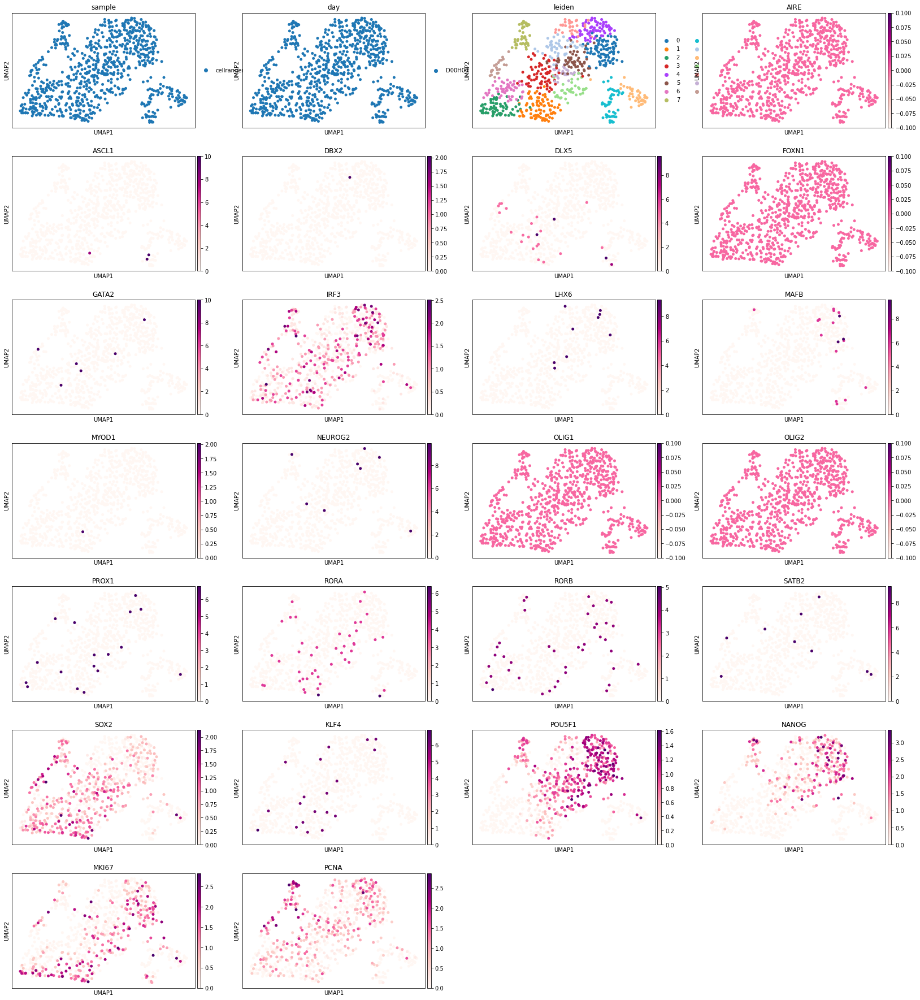

In [43]:
data_iN = sc.read_h5ad('/nfs/team205/vk7/sanger_projects/large_data/ab24_ipsc_neurones/rawdata/all_cells_20201209.h5ad')
data_iN = data_iN[data_iN.obs['day'] == 'D00H00', :].copy()

# select informative genes but keep all targeted genes
from cell2location.utils.filtering import filter_genes
selected = filter_genes(data_iN, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
plt.show()
# filter the object
selected_ensembl = list(adata_subset.var_names[adata_subset.var['SYMBOL'].isin(targeted_tf + ipsc_tf + cell_cycle).values])
data_iN = data_iN[:, np.unique(list(selected) + selected_ensembl)].copy()

### Step 1.1 - compute PCs by apply standard workflow with a few exceptions ##
data_iN = compute_pcs_knn_umap(
    data_iN, 
    tech_category_key=None, plot_category_keys=['day'], 
    scale_max_value=10, n_comps=50, n_neighbors=15,
)
# Leiden clustering
sc.tl.leiden(data_iN, resolution=2)

sc.pl.dotplot(data_iN, targeted_tf + ipsc_tf + cell_cycle, 
              groupby='leiden', color_map='RdPu', gene_symbols='SYMBOL')
sc.pl.umap(data_iN, color=['sample', 'day', 'leiden'] + targeted_tf + ipsc_tf + cell_cycle,
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.9', size=100,
           legend_fontsize=10, gene_symbols='SYMBOL')

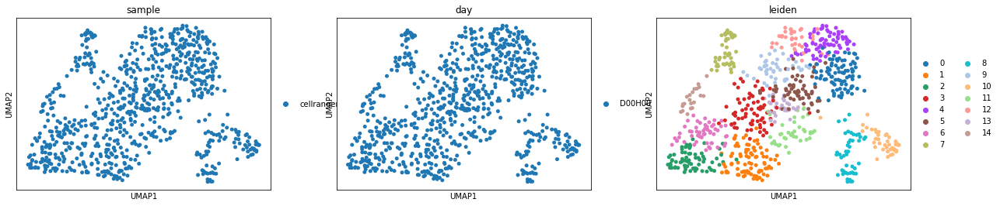

In [45]:
gene_sel = ['GATA6', 'SAT1', 'PRTG', 'GRID2', 'SYT1', 'SHANK2', 'GRID2', 
              'MECOM', 'PLCG2', 'POLG2', 'PTPRG', 'IGFBP2']
sc.pl.umap(data_iN, color=['sample', 'day', 'leiden']
           + [i for i in gene_sel if i in data_iN.var['SYMBOL']],
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.9', size=100,
           legend_fontsize=10, gene_symbols='SYMBOL')

/nfs/team283/vk7/software/miniconda3farm5/envs/test_scvi16_cuda111/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


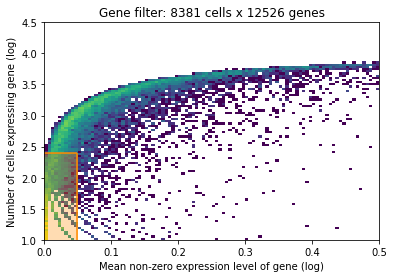

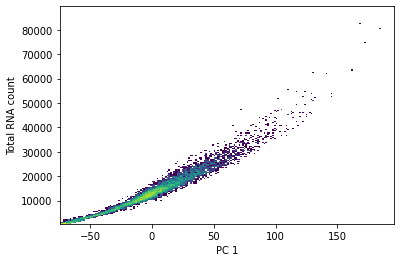

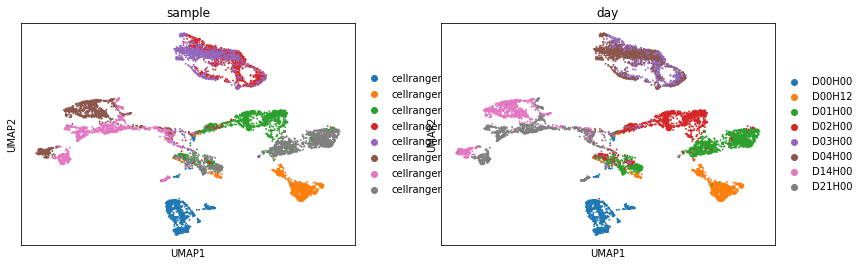

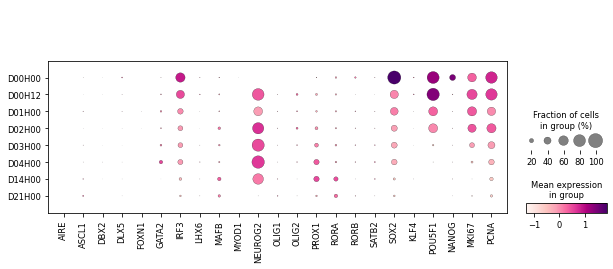

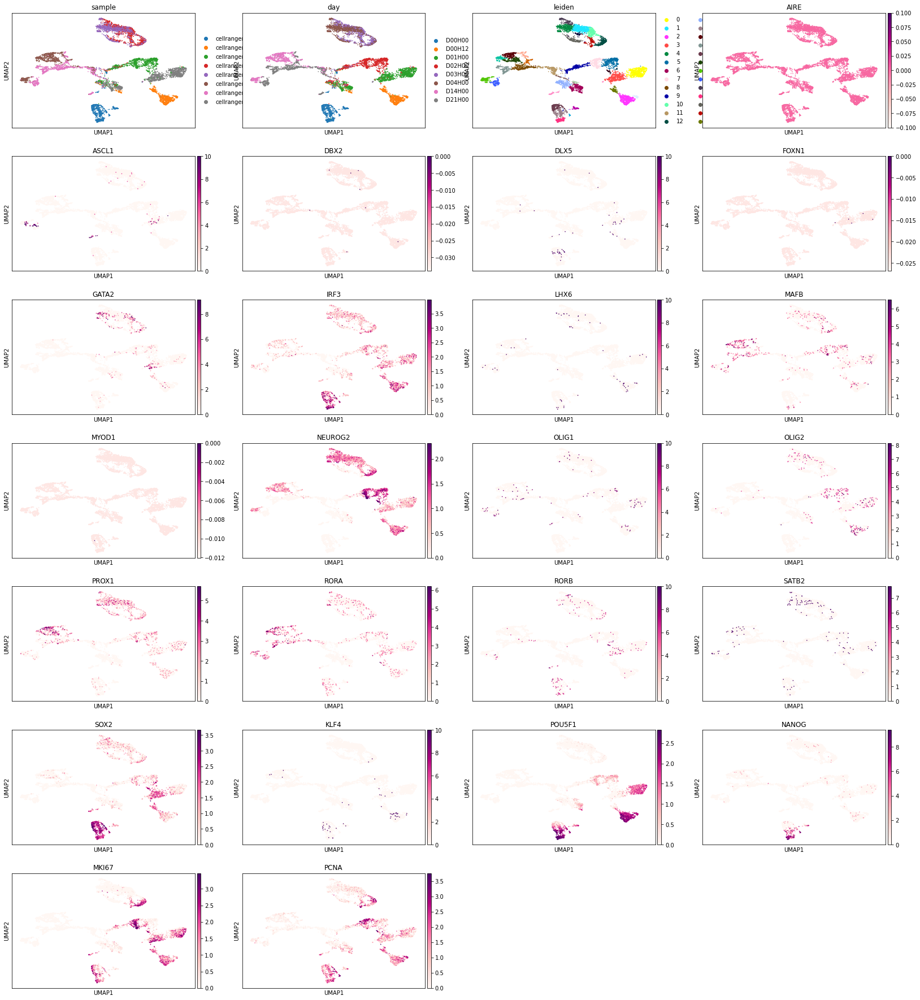

In [14]:
data_iN = sc.read_h5ad('/nfs/team205/vk7/sanger_projects/large_data/ab24_ipsc_neurones/rawdata/all_cells_20201209.h5ad')

# select informative genes but keep all targeted genes
from cell2location.utils.filtering import filter_genes
selected = filter_genes(data_iN, cell_count_cutoff=5, cell_percentage_cutoff2=0.03, nonz_mean_cutoff=1.12)
plt.show()
# filter the object
selected_ensembl = list(adata_subset.var_names[adata_subset.var['SYMBOL'].isin(targeted_tf + ipsc_tf + cell_cycle).values])
data_iN = data_iN[:, np.unique(list(selected) + selected_ensembl)].copy()

### Step 1.1 - compute PCs by apply standard workflow with a few exceptions ##
data_iN = compute_pcs_knn_umap(
    data_iN, 
    tech_category_key=None, plot_category_keys=['day'], 
    scale_max_value=10, n_comps=50, n_neighbors=15,
)
# Leiden clustering
sc.tl.leiden(data_iN, resolution=2)

sc.pl.dotplot(data_iN, targeted_tf + ipsc_tf + cell_cycle, 
              groupby='day', color_map='RdPu', gene_symbols='SYMBOL')
sc.pl.umap(data_iN, color=['sample', 'day', 'leiden'] + targeted_tf + ipsc_tf + cell_cycle,
           color_map='RdPu', ncols=4, #legend_loc='on data',
           vmin=0, vmax='p99.9', size=10,
           legend_fontsize=10, gene_symbols='SYMBOL')